In [1]:
from raw_io import read_darkframes
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import interactive
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib
import numba
import zarr
interactive(True)
%matplotlib notebook

@numba.njit(parallel=True)
def std_along_first_axis(array):
    res = np.zeros(array.shape[1:])
    for i in numba.prange(array.shape[1]):
        for j in range(array.shape[2]):
            res[i, j] = np.std(array[:,i,j])
    return res

[168.6902  172.12941 174.17255 ... 163.43529 168.75687 163.34901]


<IPython.core.display.Javascript object>


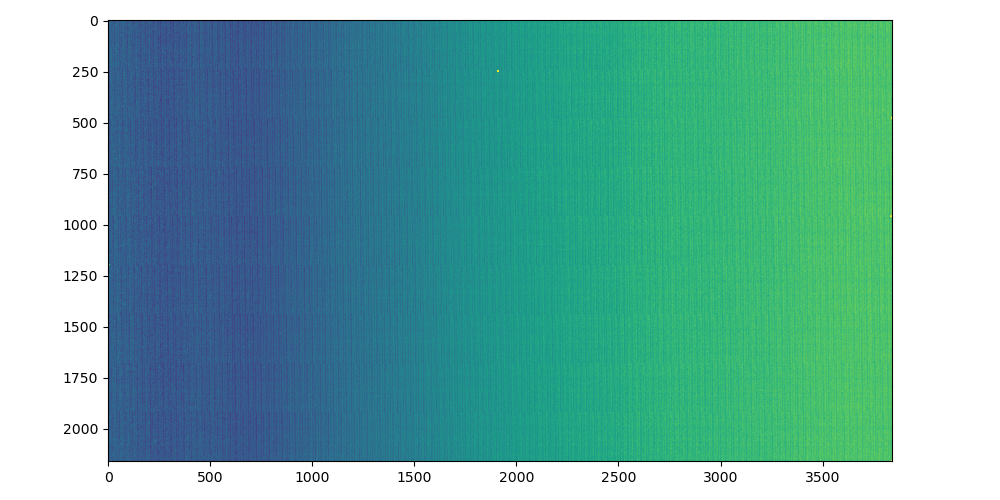

In [2]:
darkframe = zarr.open("256xdarkframe_1x_13.993392.blob.mean.zarr")[:]
print(darkframe[3])
μ = np.mean(darkframe)
σ = np.std(darkframe)
plt.figure(figsize=(10,5))
plt.imshow(darkframe.T, vmin=μ - 2*σ, vmax=μ + 2*σ)
plt.tight_layout()

In [3]:
ffs = [
    "256xflatfield_1x_1.9932959999999997.blob.mean.zarr",
    "256xflatfield_1x_2.9964.blob.mean.zarr",
    "256xflatfield_1x_6.996432.blob.mean.zarr",
    "256xflatfield_1x_13.993392.blob.mean.zarr",
]

flatfields = [((a := zarr.open(ff))[:], a.attrs["exposure"]) for ff in ffs]    
flatfields_df = [((a := zarr.open(ff))[:] - darkframe, a.attrs["exposure"]) for ff in ffs]    

<IPython.core.display.Javascript object>


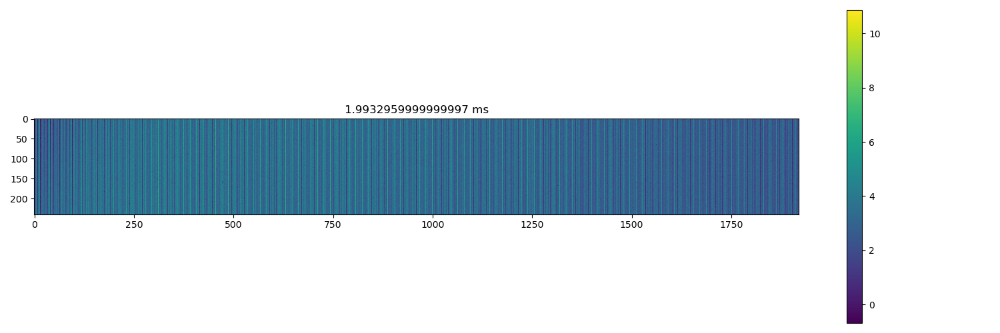

<IPython.core.display.Javascript object>


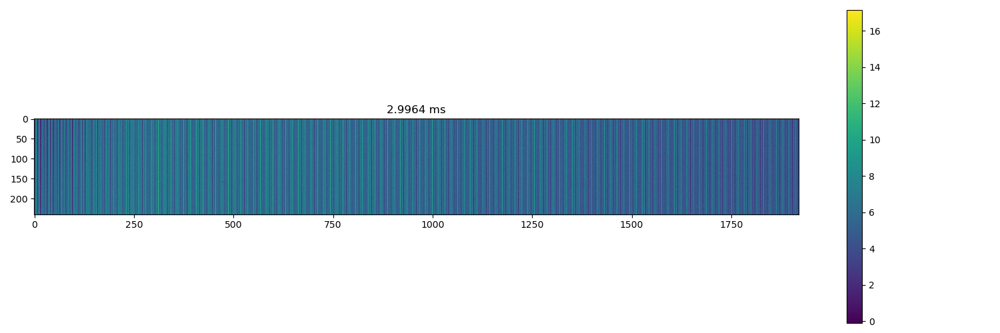

<IPython.core.display.Javascript object>


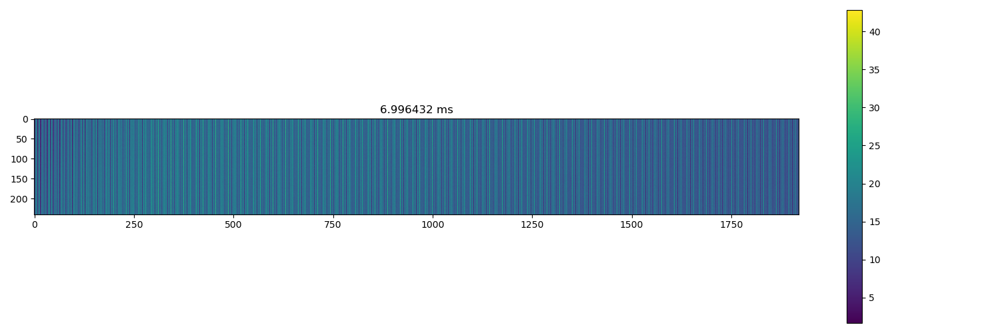

<IPython.core.display.Javascript object>


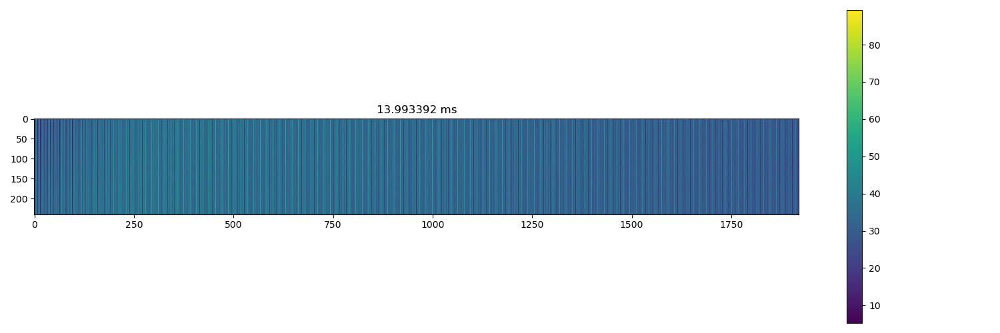

In [4]:
for flatfield, ms in flatfields:
    flatfield = (flatfield - darkframe)
    μ = np.mean(flatfield)
    σ = np.std(flatfield)
    
    plt.figure(figsize=(15,5))
    plt.title(f"{ms} ms")
    plt.imshow(flatfield[0::2,1::2][:,:240].T, vmin=μ - 2*σ, vmax=μ + 2*σ)
    plt.tight_layout()
    plt.colorbar()

0.09376735 0.12110305


<IPython.core.display.Javascript object>


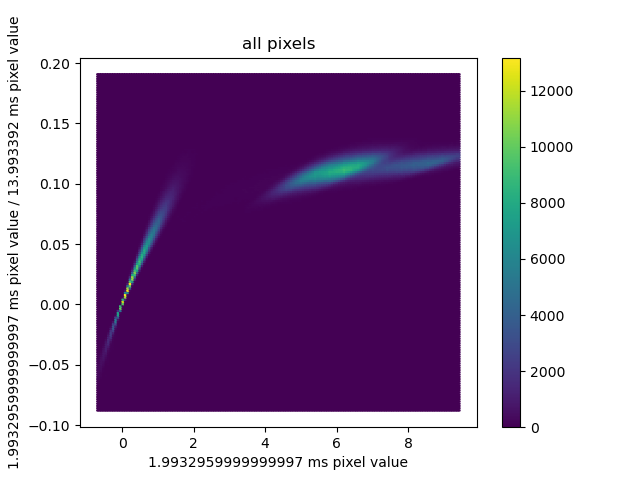

<IPython.core.display.Javascript object>


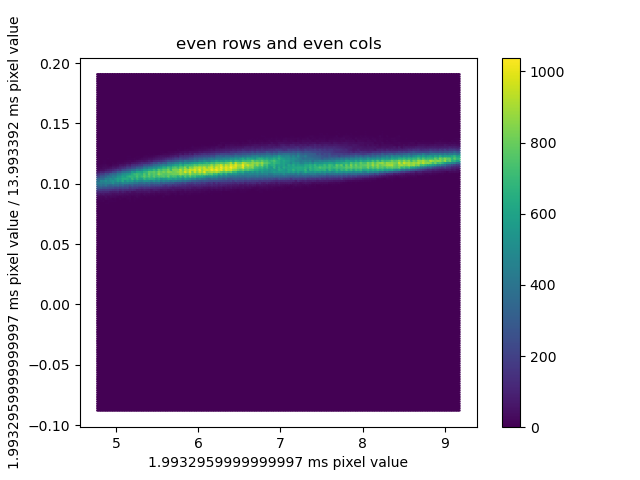

<IPython.core.display.Javascript object>


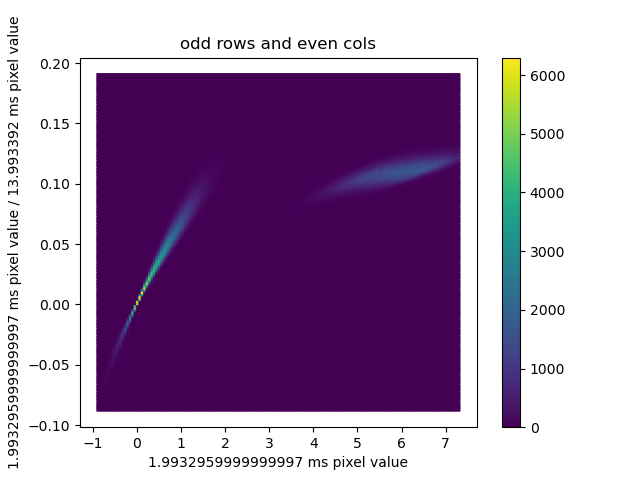

<IPython.core.display.Javascript object>


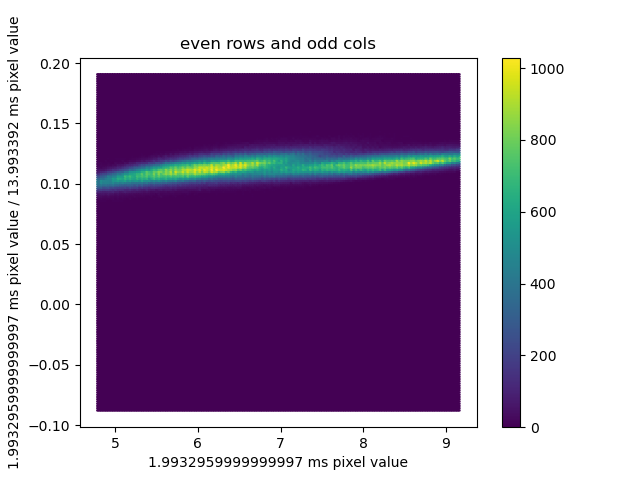

<IPython.core.display.Javascript object>


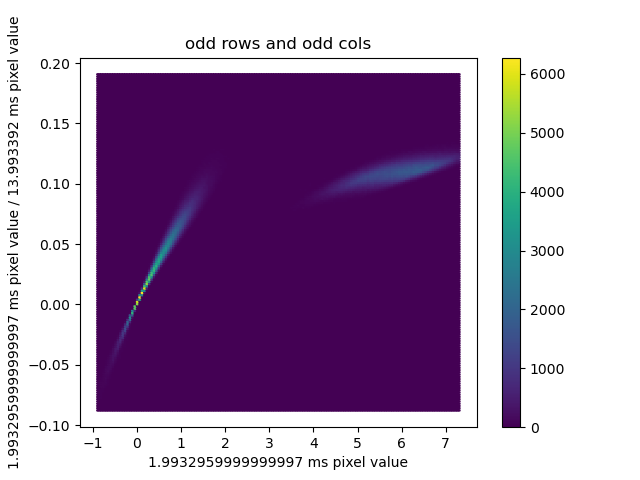

0.1686117 0.1109423


<IPython.core.display.Javascript object>


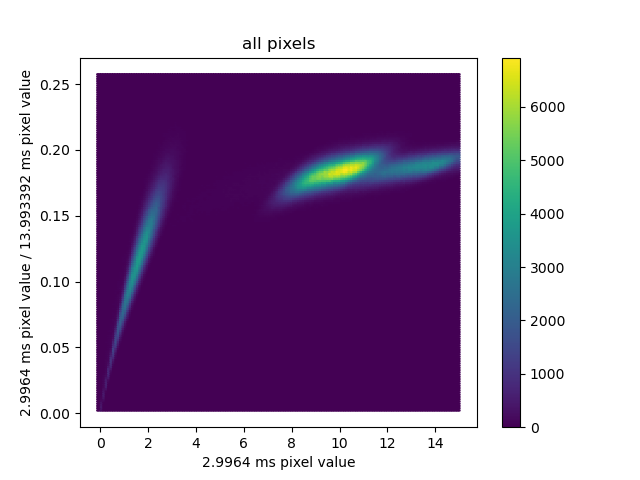

<IPython.core.display.Javascript object>


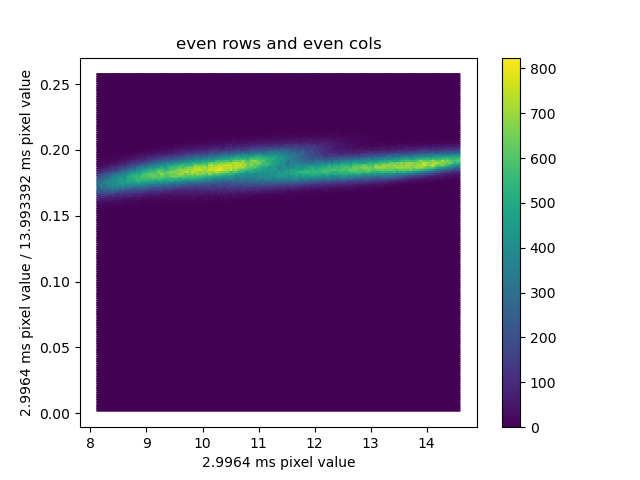

<IPython.core.display.Javascript object>


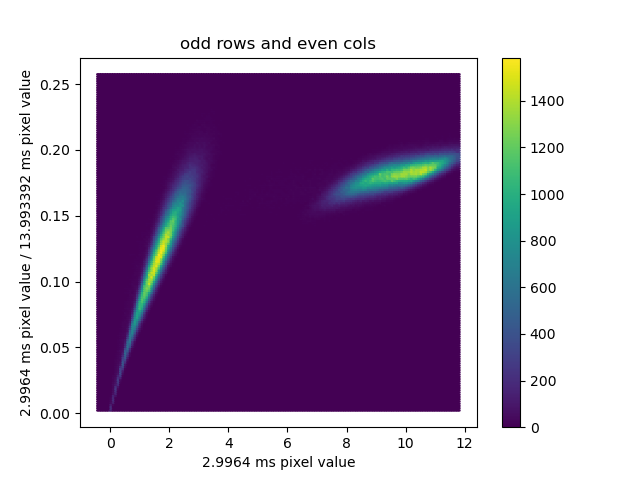

<IPython.core.display.Javascript object>


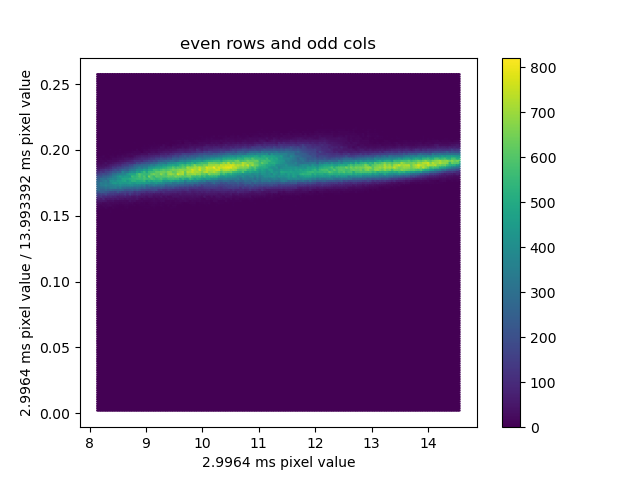

<IPython.core.display.Javascript object>


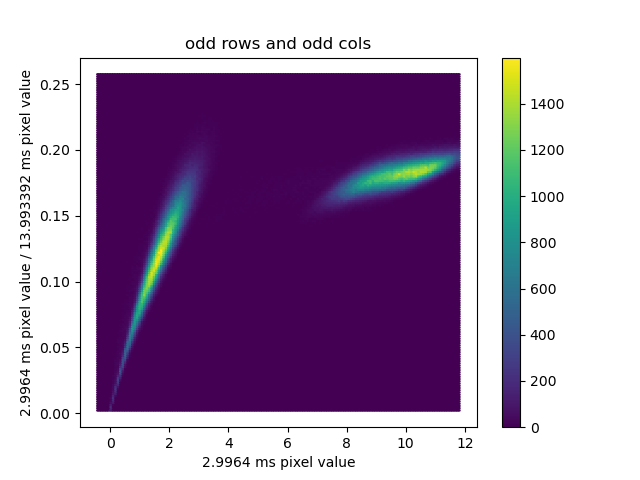

0.46112677 0.07561903


<IPython.core.display.Javascript object>


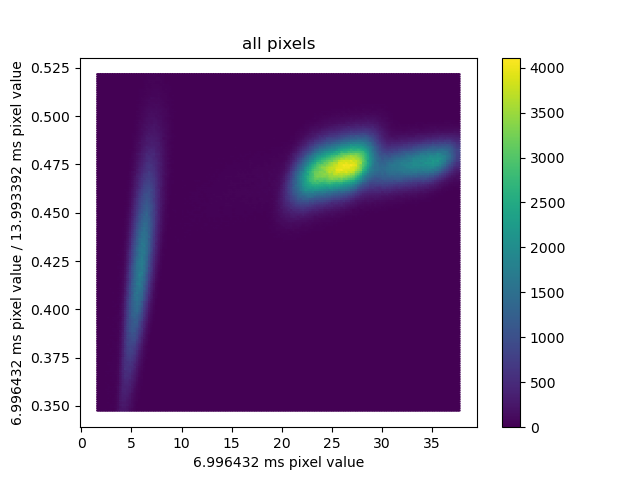

<IPython.core.display.Javascript object>


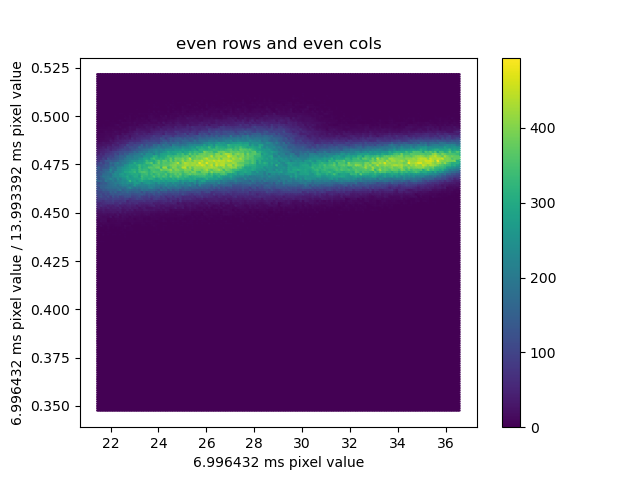

<IPython.core.display.Javascript object>


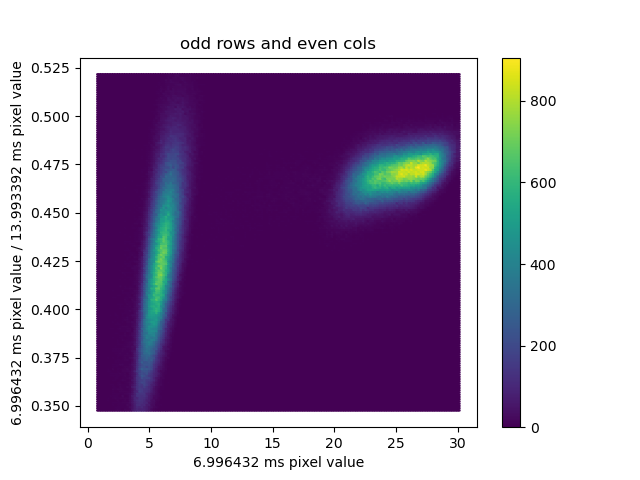

<IPython.core.display.Javascript object>


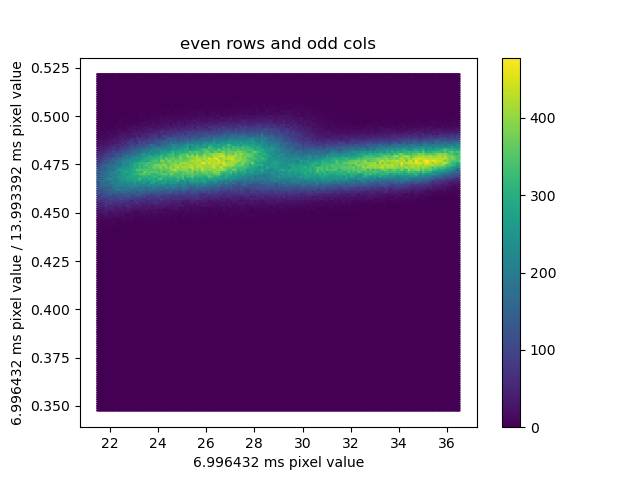

<IPython.core.display.Javascript object>


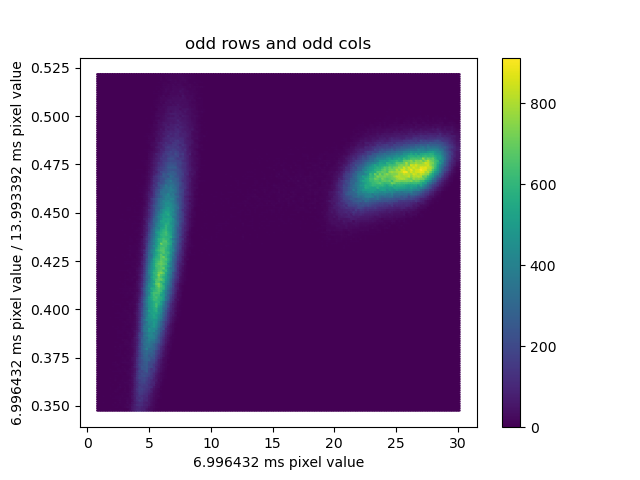

1.0 0.0


<ipython-input-5-5a474104345b>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<IPython.core.display.Javascript object>


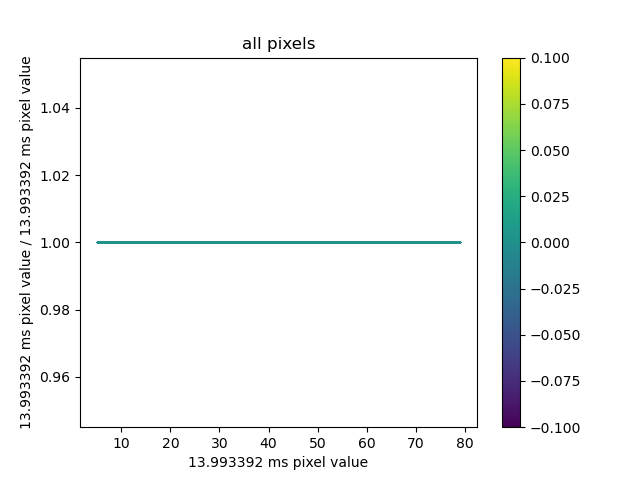

/gnu/store/s0kxy1zss4mp7w62nsknay8f76jwbwy5-python-matplotlib-3.5.1/lib/python3.9/site-packages/matplotlib/axes/_axes.py:4682: RuntimeWarning: invalid value encountered in true_divide
  y = (y - ymin) / sy


<IPython.core.display.Javascript object>


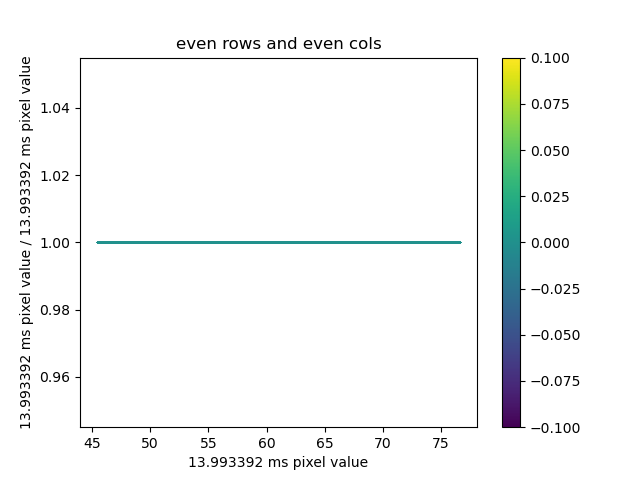

<IPython.core.display.Javascript object>


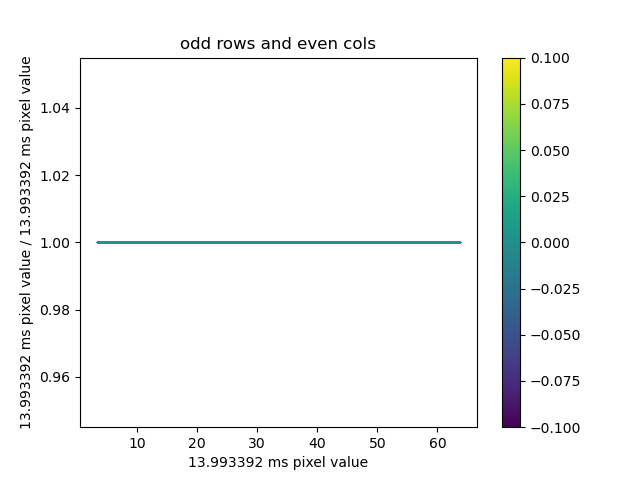

<IPython.core.display.Javascript object>


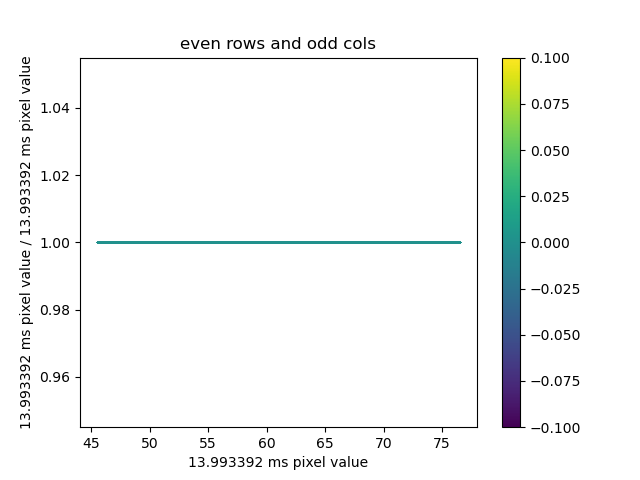

<IPython.core.display.Javascript object>


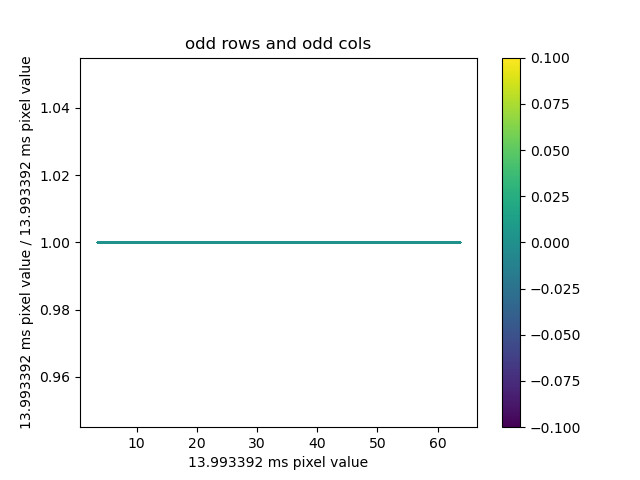

In [5]:
base = flatfields_df[-1][0]
base_ms = flatfields_df[-1][1]
base[np.where(base == 0)] = np.mean(base)
for flatfield, ms in flatfields_df:
    # plt.figure(figsize=(15,5))
    flatfield_rel = flatfield / base
    μ = np.nanmean(flatfield_rel)
    σ = np.nanstd(flatfield_rel)
    print(μ,σ)
    # plt.imshow(flatfield_rel.T, vmin=μ - 2*σ, vmax=μ + 2*σ)
    # plt.figure()
    # bins = np.linspace(μ - 2 * σ, μ + 1 * σ, 50)
    # plt.hist(np.ravel(flatfield_rel), bins=bins)
    
    plt.figure()
    plt.title("all pixels")
    plt.ylabel(f"{ms} ms pixel value / {base_ms} ms pixel value")
    plt.xlabel(f"{ms} ms pixel value")
    μn = np.mean(flatfield)
    σn = np.std(flatfield)
    plt.hexbin(np.ravel(flatfield), np.ravel(flatfield_rel), gridsize=(150,150), extent=(μn - 2 * σn, μn + 1.5 * σn, μ - 1.5 * σ, μ + 0.8 * σ))
    plt.colorbar()
    for x in range(2):
        for y in range(2):
            ff = flatfield[x::2,y::2]
            ff_rel = flatfield_rel[x::2,y::2]
            plt.figure()
            rows = "odd" if y == 1 else "even"
            cols = "odd" if x == 1 else "even"
            plt.title(f"{rows} rows and {cols} cols")
            plt.ylabel(f"{ms} ms pixel value / {base_ms} ms pixel value")
            plt.xlabel(f"{ms} ms pixel value")
            μn = np.mean(ff)
            σn = np.std(ff)
            plt.hexbin(np.ravel(ff), np.ravel(ff_rel), gridsize=(150,150), extent=(μn - 1.5 * σn, μn + 1.5 * σn, μ - 1.5 * σ, μ + 0.8 * σ))
            plt.colorbar()
            
    # pdf = PdfPages(f"corr_{ms}_by_{base_ms}.pdf")
    # for n in plt.get_fignums():
    #    plt.figure(n).savefig(pdf, format="pdf")
    # plt.close('all')
    # pdf.close()

    # plt.savefig(f"corr_{ms}_by_{base_ms}.pdf")

<IPython.core.display.Javascript object>


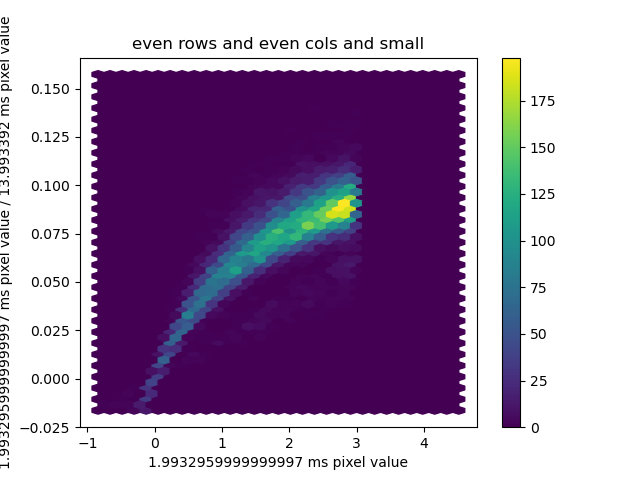

[1.9932959999999997]: even rows, even cols, small: percent = 0.006821469907407407


<IPython.core.display.Javascript object>


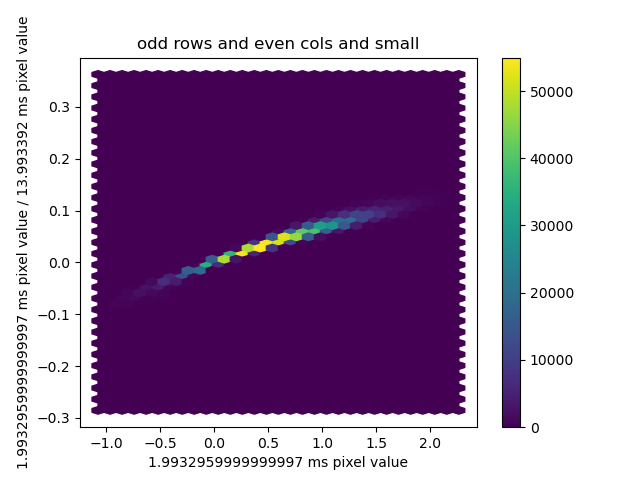

[1.9932959999999997]: odd rows, even cols, small: percent = 0.5048027584876543


<IPython.core.display.Javascript object>


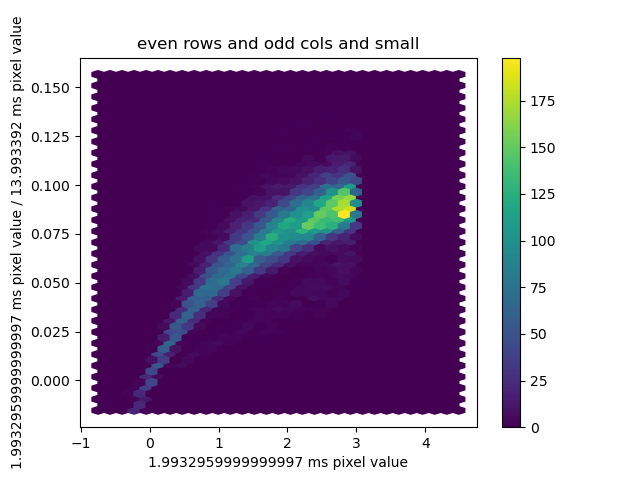

[1.9932959999999997]: even rows, odd cols, small: percent = 0.0066049382716049385


<IPython.core.display.Javascript object>


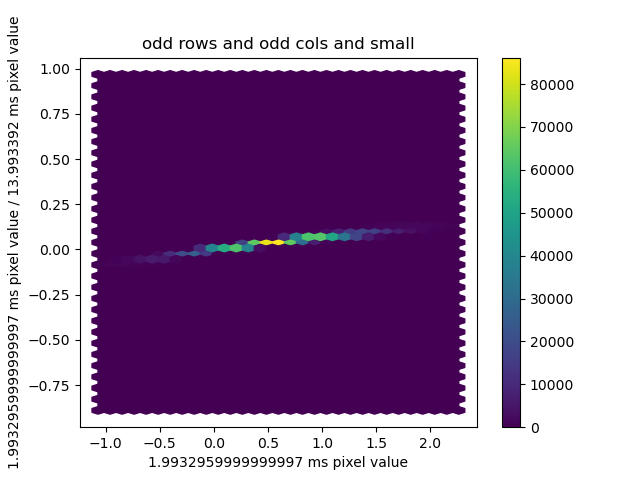

[1.9932959999999997]: odd rows, odd cols, small: percent = 0.5046662808641975


<IPython.core.display.Javascript object>


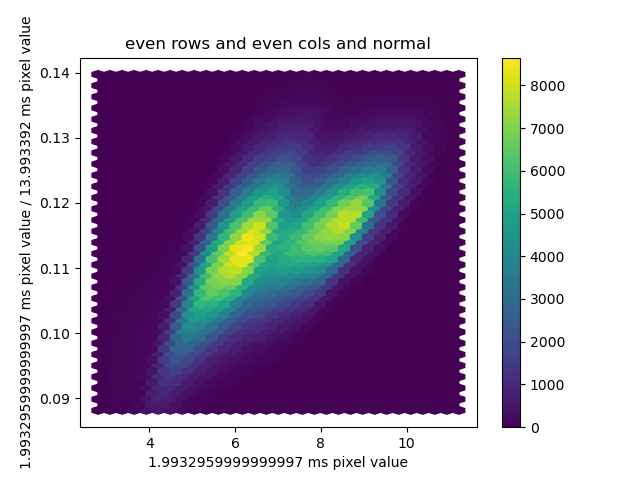

[1.9932959999999997]: even rows, even cols, normal: percent = 0.9931785300925926


<IPython.core.display.Javascript object>


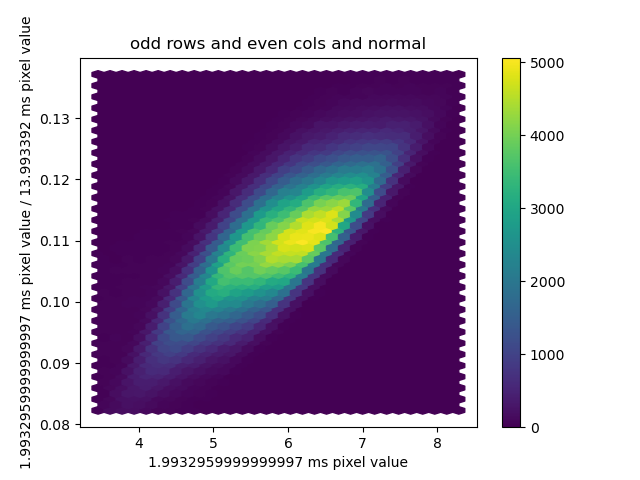

[1.9932959999999997]: odd rows, even cols, normal: percent = 0.4951972415123457


<IPython.core.display.Javascript object>


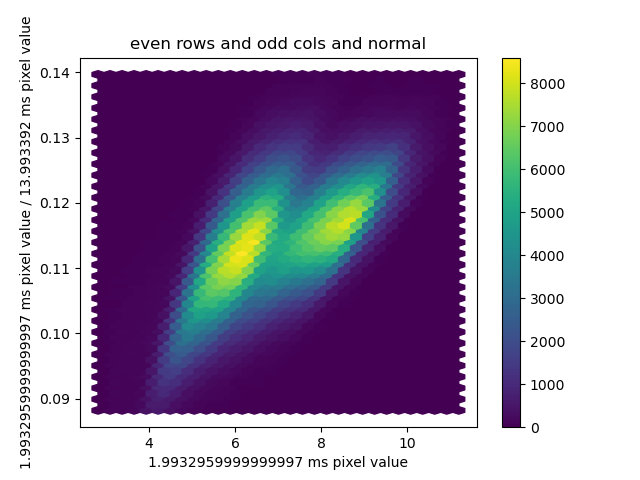

[1.9932959999999997]: even rows, odd cols, normal: percent = 0.9933950617283951


<IPython.core.display.Javascript object>


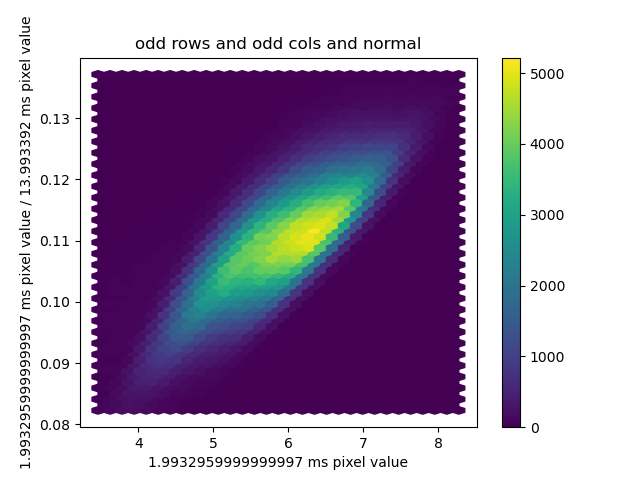

[1.9932959999999997]: odd rows, odd cols, normal: percent = 0.4953337191358025


<IPython.core.display.Javascript object>


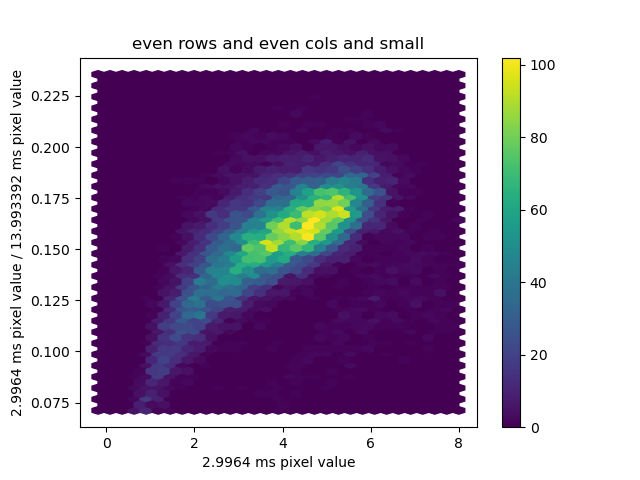

[2.9964]: even rows, even cols, small: percent = 0.006821469907407407


<IPython.core.display.Javascript object>


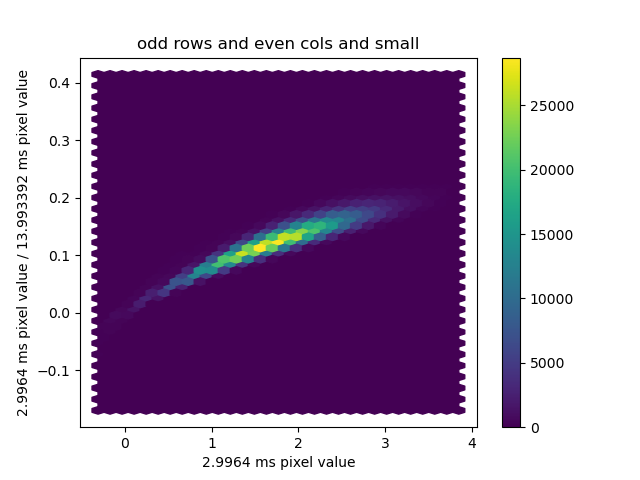

[2.9964]: odd rows, even cols, small: percent = 0.5048027584876543


<IPython.core.display.Javascript object>


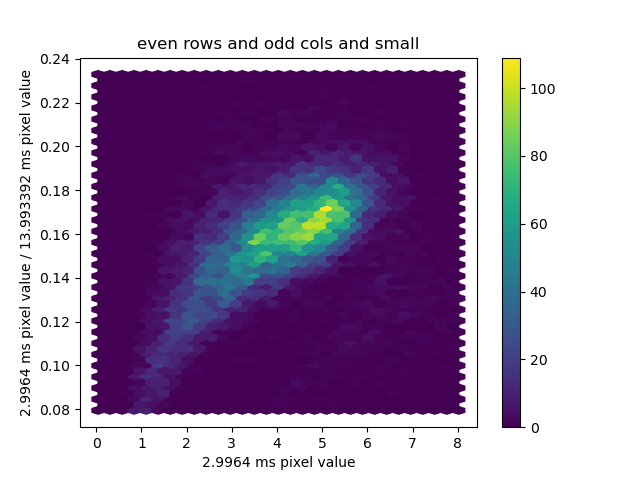

[2.9964]: even rows, odd cols, small: percent = 0.0066049382716049385


<IPython.core.display.Javascript object>


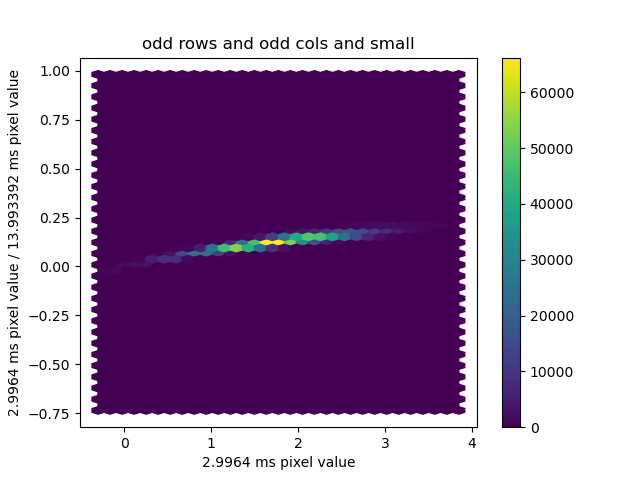

[2.9964]: odd rows, odd cols, small: percent = 0.5046662808641975


<IPython.core.display.Javascript object>


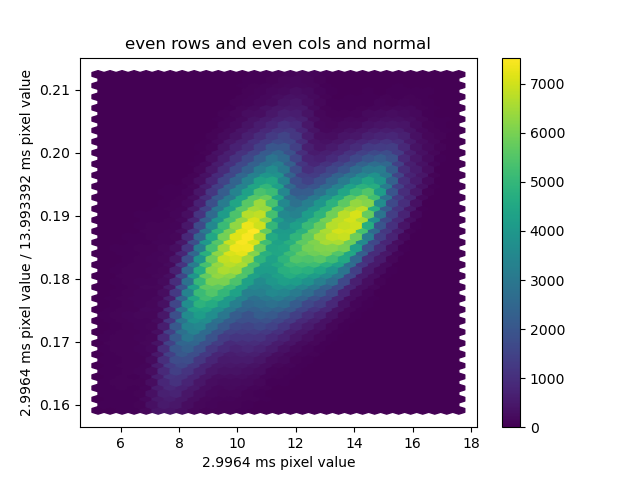

[2.9964]: even rows, even cols, normal: percent = 0.9931785300925926


<IPython.core.display.Javascript object>


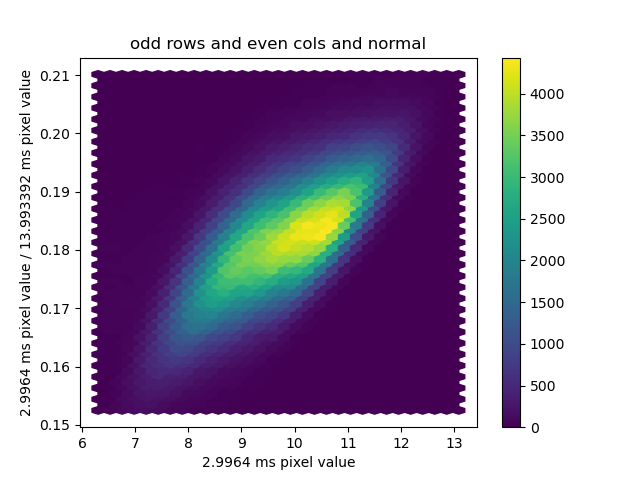

[2.9964]: odd rows, even cols, normal: percent = 0.4951972415123457


<IPython.core.display.Javascript object>


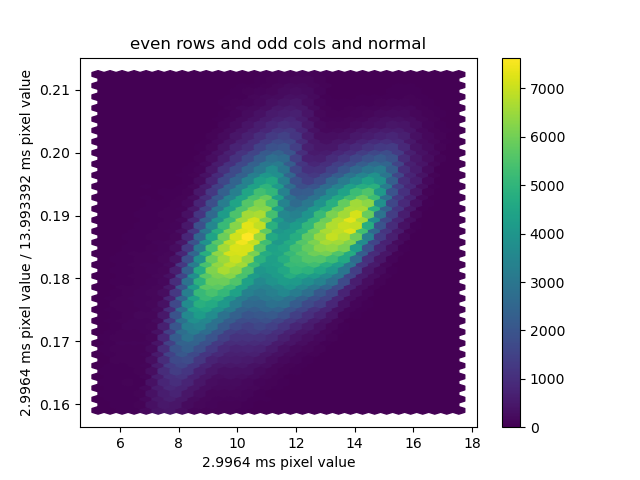

[2.9964]: even rows, odd cols, normal: percent = 0.9933950617283951


<IPython.core.display.Javascript object>


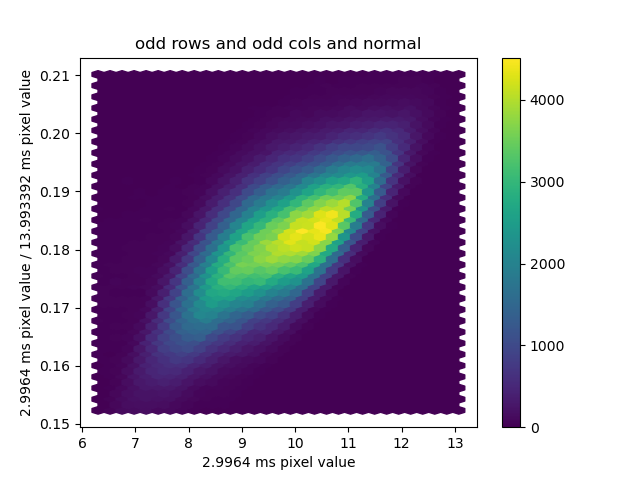

[2.9964]: odd rows, odd cols, normal: percent = 0.4953337191358025


<IPython.core.display.Javascript object>


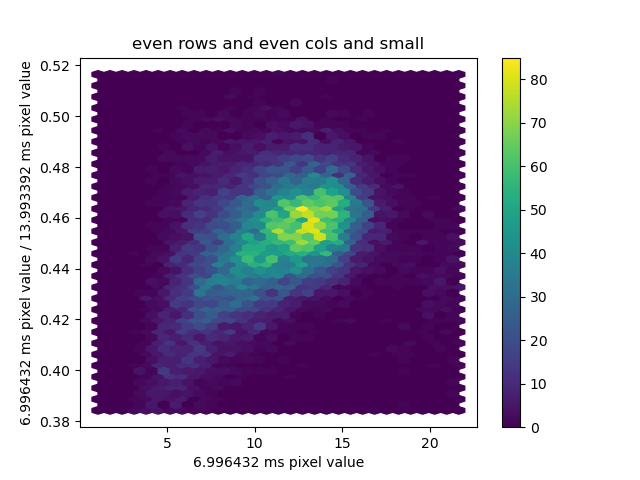

[6.996432]: even rows, even cols, small: percent = 0.006821469907407407


<IPython.core.display.Javascript object>


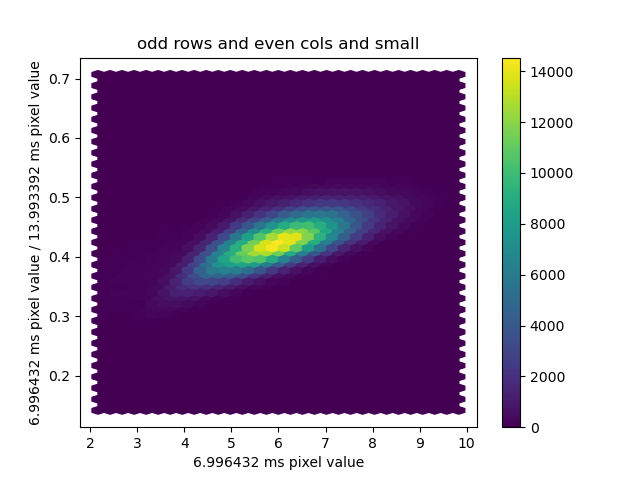

[6.996432]: odd rows, even cols, small: percent = 0.5048027584876543


<IPython.core.display.Javascript object>


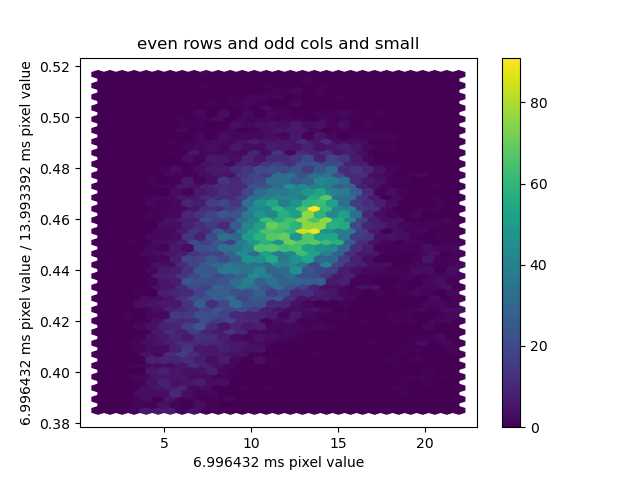

[6.996432]: even rows, odd cols, small: percent = 0.0066049382716049385


<IPython.core.display.Javascript object>


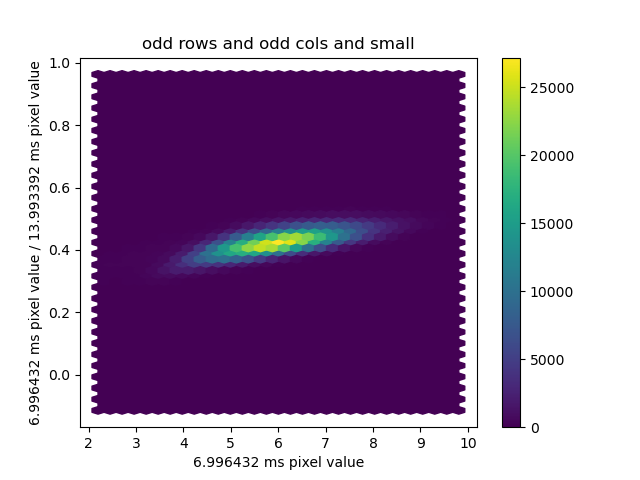

[6.996432]: odd rows, odd cols, small: percent = 0.5046662808641975


<IPython.core.display.Javascript object>


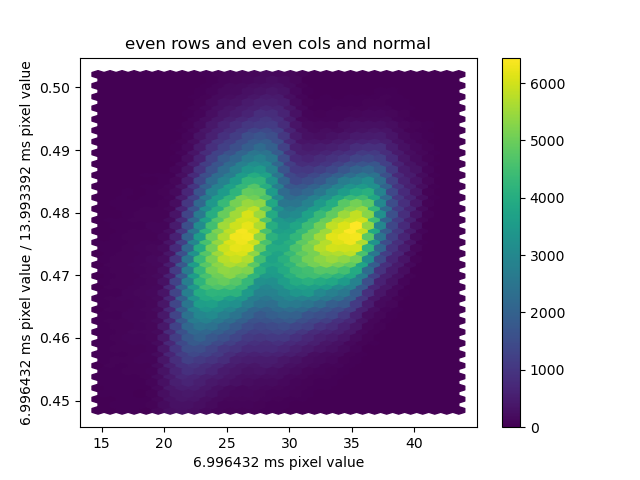

[6.996432]: even rows, even cols, normal: percent = 0.9931785300925926


<IPython.core.display.Javascript object>


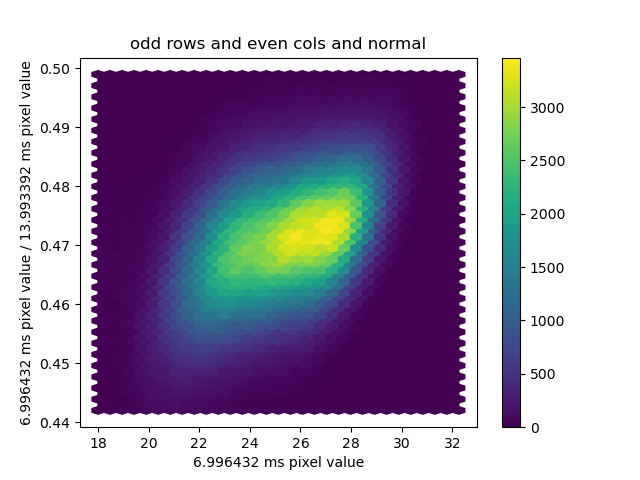

[6.996432]: odd rows, even cols, normal: percent = 0.4951972415123457


<IPython.core.display.Javascript object>


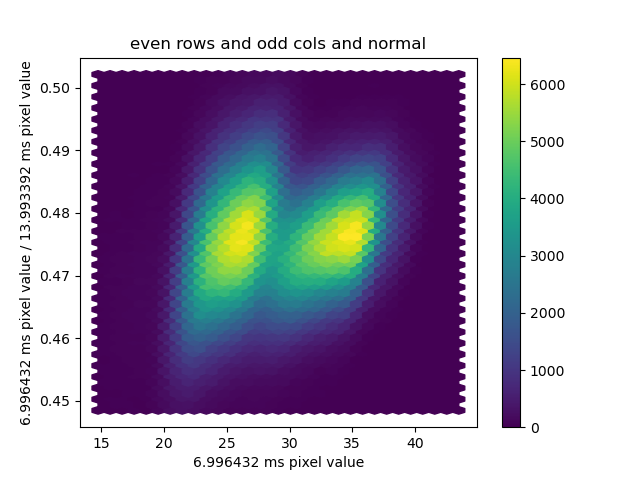

[6.996432]: even rows, odd cols, normal: percent = 0.9933950617283951


<IPython.core.display.Javascript object>


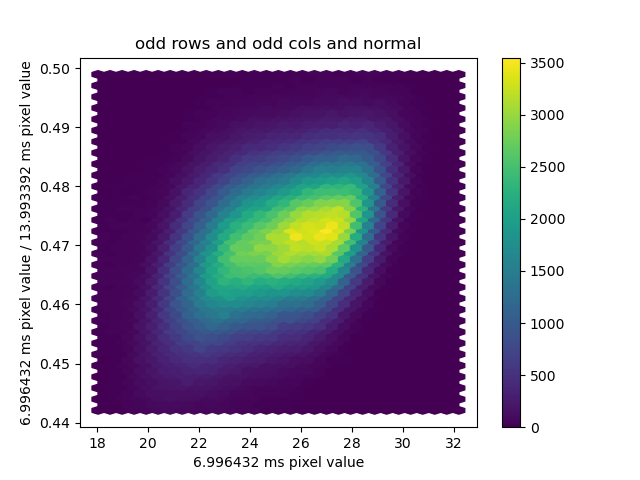

[6.996432]: odd rows, odd cols, normal: percent = 0.4953337191358025


<IPython.core.display.Javascript object>


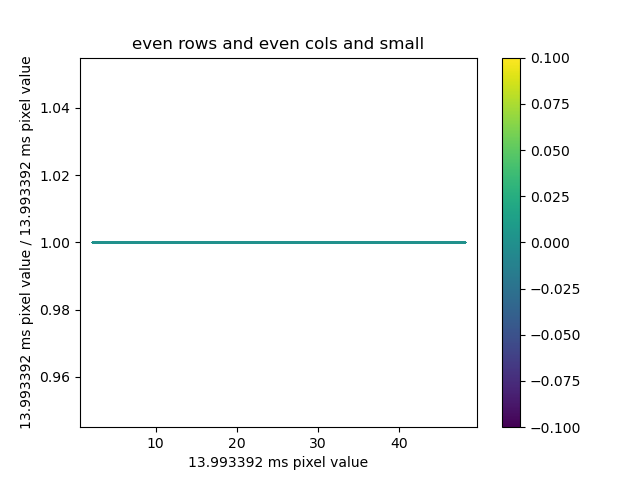

[13.993392]: even rows, even cols, small: percent = 0.006821469907407407


<IPython.core.display.Javascript object>


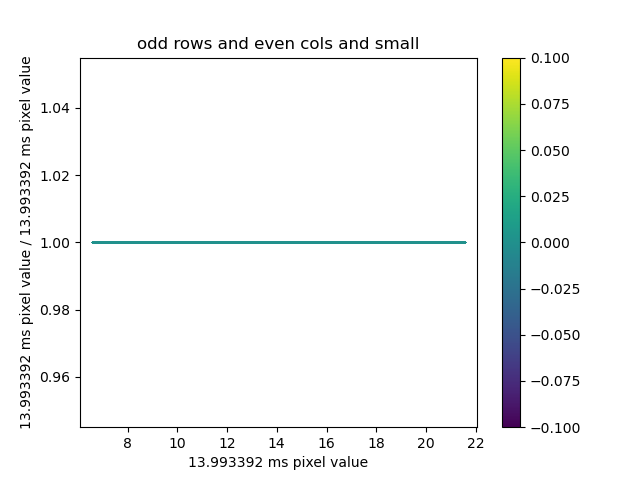

[13.993392]: odd rows, even cols, small: percent = 0.5048027584876543


<IPython.core.display.Javascript object>


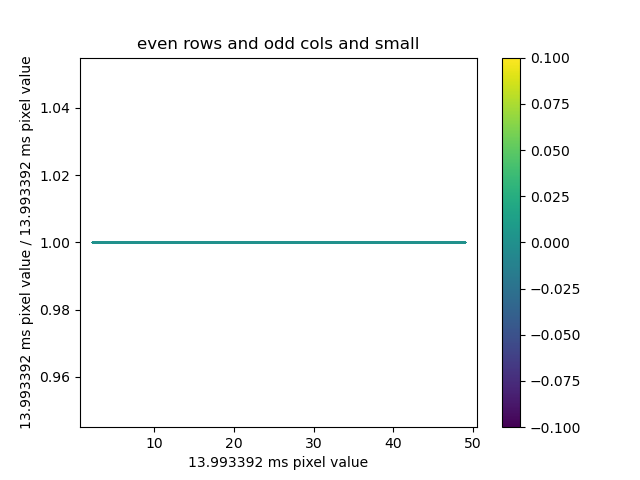

[13.993392]: even rows, odd cols, small: percent = 0.0066049382716049385


<IPython.core.display.Javascript object>


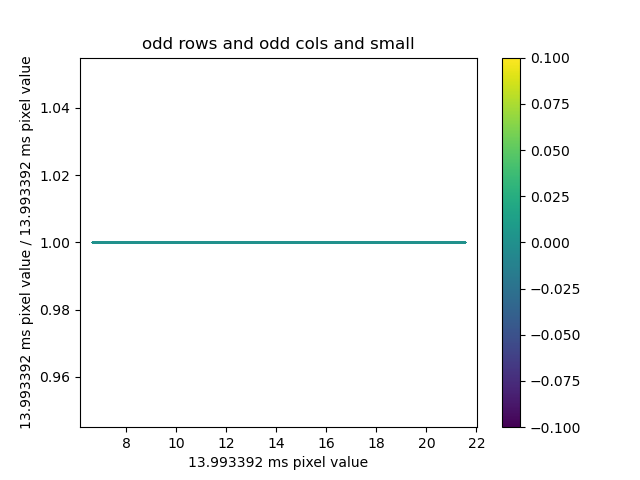

[13.993392]: odd rows, odd cols, small: percent = 0.5046662808641975


<IPython.core.display.Javascript object>


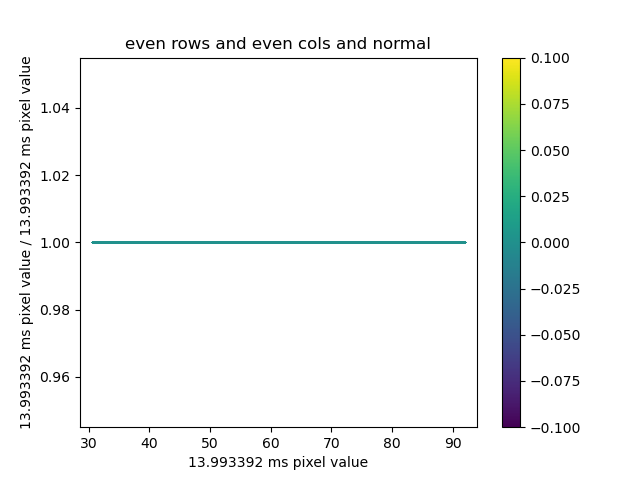

[13.993392]: even rows, even cols, normal: percent = 0.9931785300925926


<IPython.core.display.Javascript object>


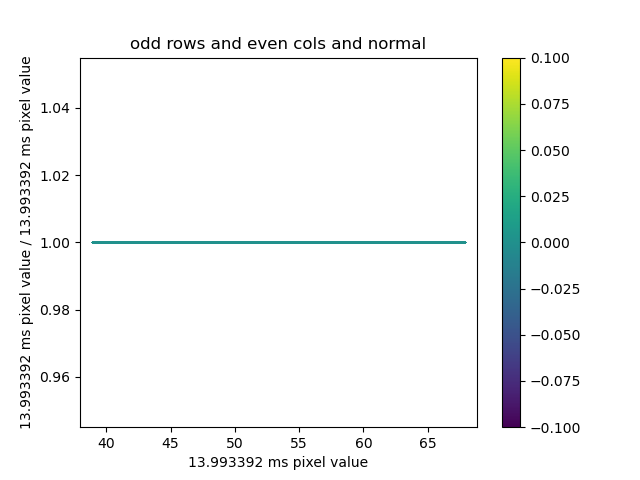

[13.993392]: odd rows, even cols, normal: percent = 0.4951972415123457


<IPython.core.display.Javascript object>


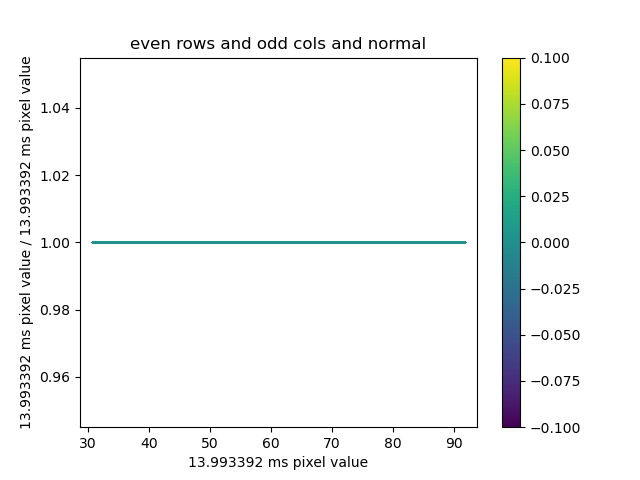

[13.993392]: even rows, odd cols, normal: percent = 0.9933950617283951


<IPython.core.display.Javascript object>


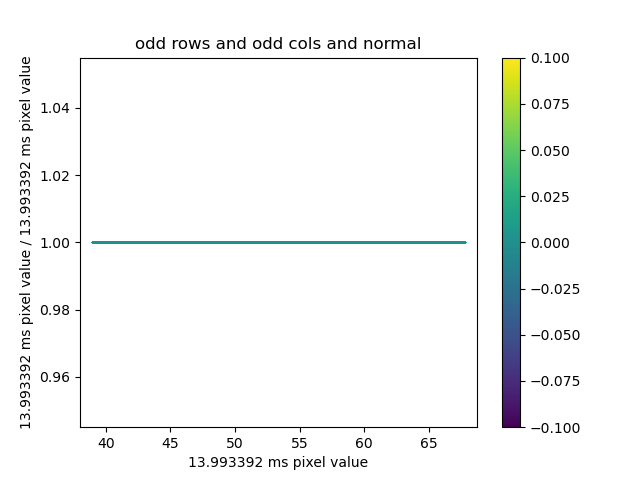

[13.993392]: odd rows, odd cols, normal: percent = 0.4953337191358025


In [19]:
base = flatfields_df[-1][0]
base_ms = flatfields_df[-1][1]
base[np.where(base == 0)] = np.mean(base)

for flatfield, ms in flatfields_df:
    flatfield_rel = flatfield / base
    for mname in ["small", "normal"]:
        for x in range(2):
            for y in range(2):
                if mname == "small":
                    mask = np.where(flatfields_df[0][0][x::2,y::2] < 3)
                else:
                    mask = np.where(flatfields_df[0][0][x::2,y::2] >= 3)

                ff = flatfield[x::2,y::2][mask]
                ff_rel = flatfield_rel[x::2,y::2][mask]
                plt.figure()
                rows = "odd" if y == 1 else "even"
                cols = "odd" if x == 1 else "even"
                
                print(f"[{ms}]: {rows} rows, {cols} cols, {mname}: percent = {len(ff) / len(np.ravel(flatfield)) * 4}")
                
                plt.title(f"{rows} rows and {cols} cols and {mname}")
                plt.ylabel(f"{ms} ms pixel value / {base_ms} ms pixel value")
                plt.xlabel(f"{ms} ms pixel value")
                μn = np.mean(ff)
                σn = np.std(ff)
                μ = np.nanmean(ff_rel)
                σ = np.nanstd(ff_rel)
                plt.hexbin(np.ravel(ff), np.ravel(ff_rel), gridsize=(30,30), extent=(μn - 3 * σn, μn + 3 * σn, μ - 3 * σ, μ + 3 * σ))
                plt.colorbar()

In [29]:
pattern = np.zeros_like(flatfields_df[0][0])
pattern[np.where(flatfields_df[0][0] < 3)] = 1

for x in range(2):
    for y in range(2):
        rows = "odd" if y == 1 else "even"
        cols = "odd" if x == 1 else "even"
        plt.imsave(f"weird_pixels_{rows}_rows_{cols}_cols.png", pattern[x::2,y::2].T, cmap="gray")

In [18]:
def normalize(arr, sigmas=3):
    μ = np.mean(arr)
    σ = np.std(arr)
    return np.clip((arr - μ + sigmas * σ) / (2 * sigmas * σ), 0.0, 1.0)

norm_mean_df = normalize(mean_darkframes)
norm_std_df = normalize(std_darkframes)
rgb = np.zeros(norm_mean_df.shape + (3,))
rgb[:,:,0] = norm_mean_df
rgb[:,:,2] = norm_std_df
matplotlib.image.imsave("per_pixel_mean_std.png", np.swapaxes(rgb, 0, 1))

norm_mean_df = norm_mean_df.reshape((norm_mean_df.shape[0] * 2, -1))
norm_std_df = norm_std_df.reshape(norm_mean_df.shape)
rgb = np.zeros(norm_mean_df.shape + (3,))
rgb[:,:,0] = norm_mean_df
rgb[:,:,2] = norm_std_df
matplotlib.image.imsave("per_pixel_mean_std_wide.png", np.swapaxes(rgb, 0, 1))

<IPython.core.display.Javascript object>


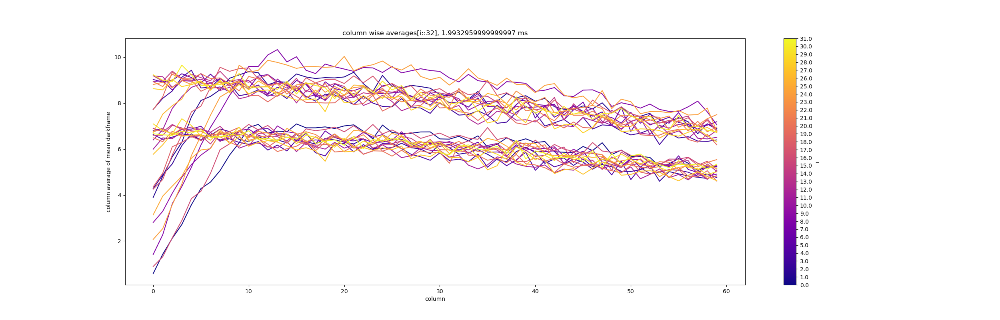

<IPython.core.display.Javascript object>


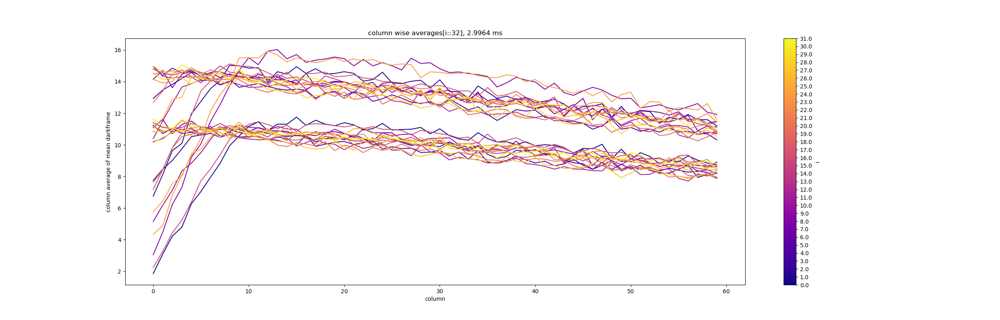

<IPython.core.display.Javascript object>


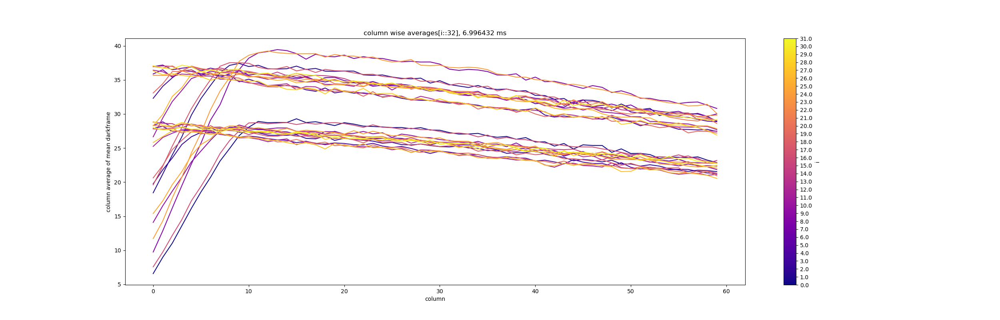

<IPython.core.display.Javascript object>


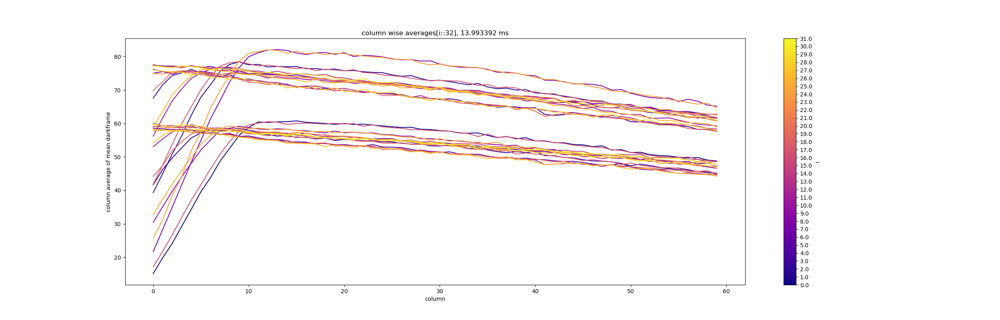

In [72]:
for flatfield, ms in flatfields:
    flatfield = flatfield - darkframe
    flatfield = flatfield[::2,::2][:,:240]
    plt.figure(figsize=(25,8))
    #plt.semilogy(np.mean(np.abs(np.fft.rfft2(mean_darkframes)), axis=1).T)
    column_mean = np.mean(flatfield, axis=1)
    n = 32
    norm = matplotlib.colors.Normalize(vmin = 0, vmax = n - 1)
    cmap = matplotlib.cm.ScalarMappable(norm = norm, cmap = matplotlib.cm.get_cmap('plasma'))
    ticks = np.linspace(0, n - 1, n)
    ticks_text = [f"{tick}" for tick in ticks]
    cbar = plt.colorbar(cmap, ticks=np.linspace(0, n - 1, n))
    cbar.ax.set_yticklabels(ticks_text)
    cbar.set_label('i')

    for i in range(n):
        plt.plot(column_mean[i::n], label=f"i = {i}", color=cmap.to_rgba(i))

    plt.xlabel("column")
    plt.ylabel("column average of mean darkframe")
    plt.title(f"column wise averages[i::{n}], {ms} ms")
    plt.savefig("column_wise_averages.png", dpi=600)

<IPython.core.display.Javascript object>


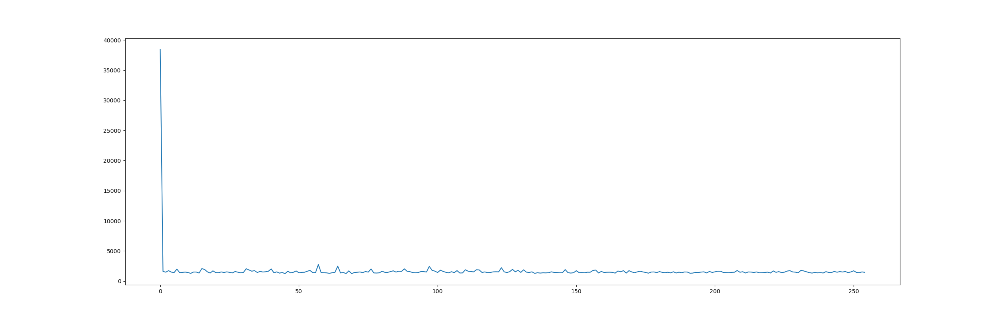

In [6]:
if False:
    plt.figure(figsize=(25,8))
    # plt.plot(column_mean)
    n = 32

    partition = [
        [0, 1, 2],
        [3],
        [4, 5, 6],
        [7, 8, 9],
        [10],
        [11, 12, 13],
        [14, 15, 16, 17],
        [18, 19, 20],
        [21],
        [22, 23, 24],
        [25, 26, 27],
        [28],
        [29, 30, 31]
    ]
    
    def calc_res(cm):
        res = 0
        ms = []
        for i in range(len(partition)):
            p = partition[i]
            if len(p) > 1:
                columns = np.vstack([cm[k::n] for k in p])
                m = np.mean(columns, axis=0)
            else:
                m1 = np.mean(np.vstack([cm[k::n] for k in partition[i - 1]]), axis=0)
                m2 = np.mean(np.vstack([cm[k::n] for k in partition[i + 1]]), axis=0)
                m = (m1 + m2) / 2.
        
            ms.append(m)
            for k in p:
                res += np.sum((cm[k::n] - m)**2)
            
        return res, np.vstack(ms)


    mms = []
    ress = []
    for i in range(darkframes.shape[0]):
        res, ms = calc_res(np.mean(darkframes[i] - mean_darkframes, axis=1))
        ress.append(res)
        mms.append(ms)
    
    mms = np.stack(mms)
    μms = np.mean(mms, axis=0)
# plt.plot(mms[0].T[:,0], color="black")
# plt.plot(mms[1].T)
    plt.plot(ress)
#print(np.sum(column_mean**2), res)
        #    plt.plot(column_mean[p::n])
    
# kk = []
# for n in range(1,128):
#     l = column_mean.shape[0] // n * n
#     a = []
#     for i in range(n):
#         a.append(column_mean[i:l:n])
#     a = np.vstack(a)
#     m = np.mean(a, axis=0)
#     print(m)
#     k = np.std(a - m) 
#     kk.append(k)

# plt.plot(kk)


mean = -0.6742818355560303 +- 6.3640265464782715


<IPython.core.display.Javascript object>


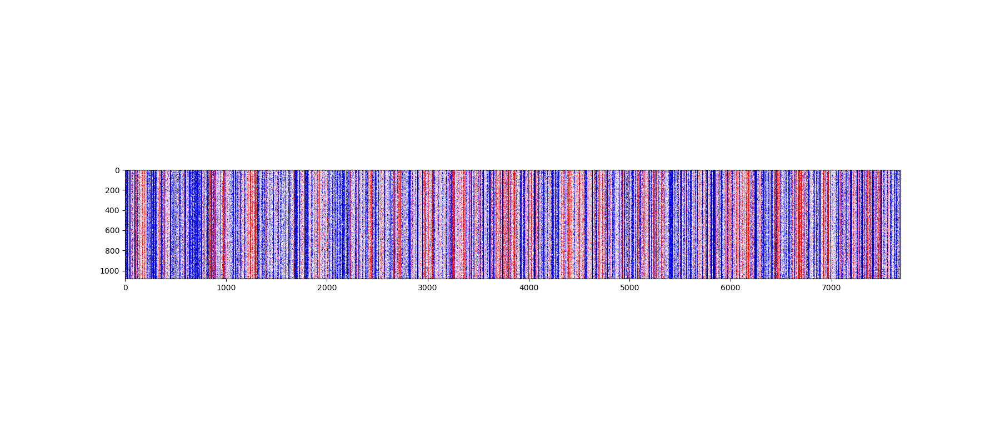

<IPython.core.display.Javascript object>


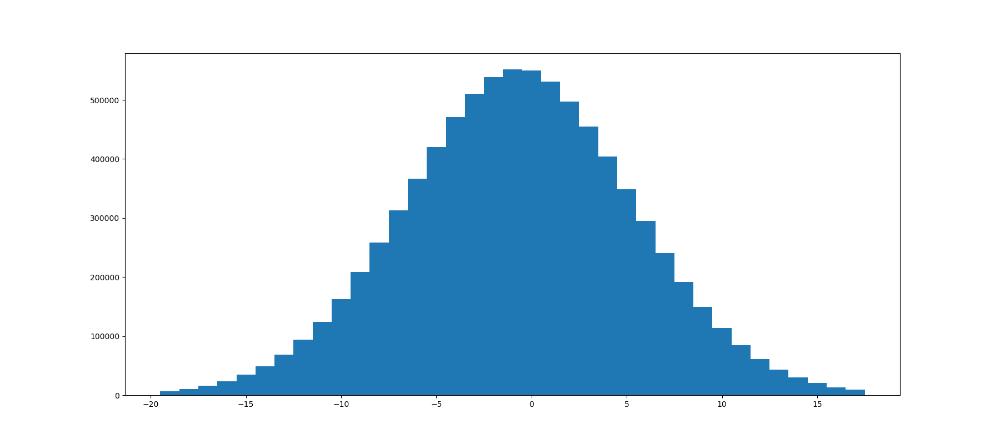

<IPython.core.display.Javascript object>


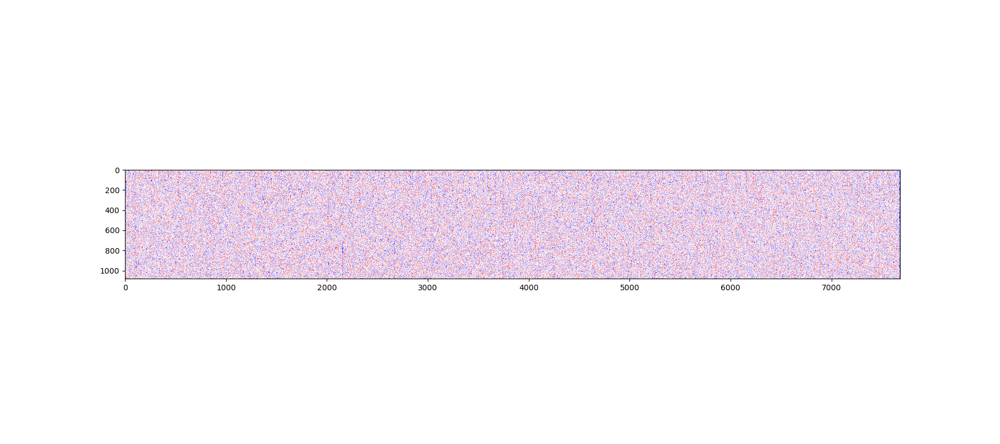

mean = 1.221527323735927e-09 +- 5.9738688468933105


<IPython.core.display.Javascript object>


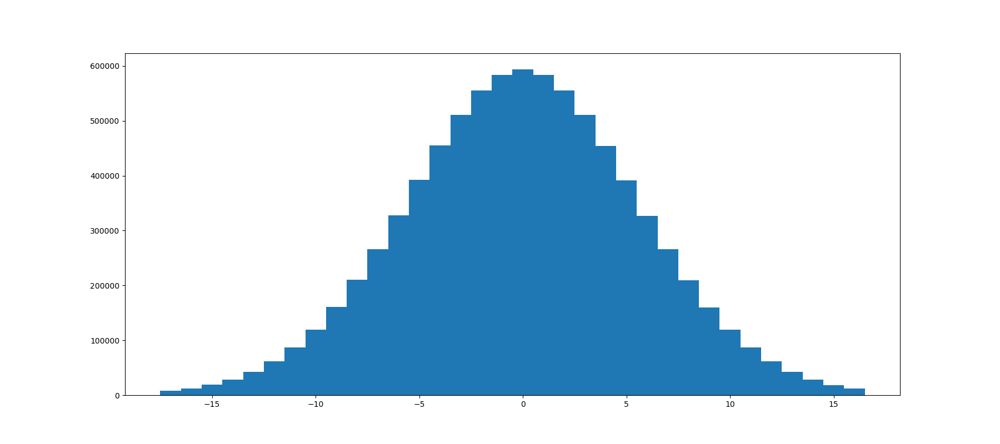

<IPython.core.display.Javascript object>


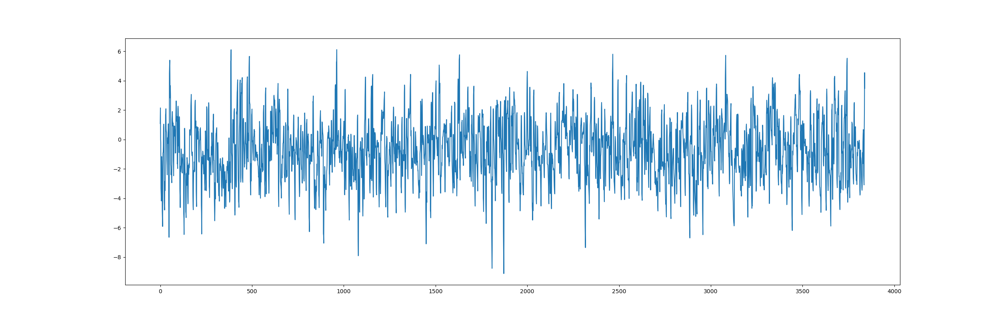

<IPython.core.display.Javascript object>


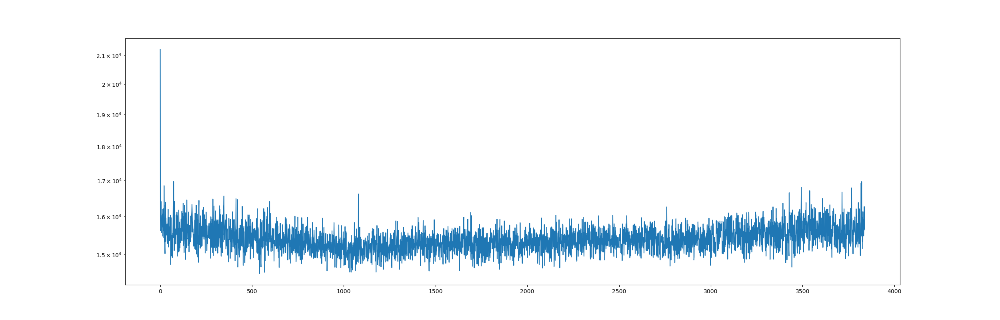

In [20]:
df = (darkframes[10] - mean_darkframes).reshape((darkframes[10].shape[0] * 2, -1))
μ = np.mean(df)
σ = np.std(df)
print(f"mean = {μ} +- {σ}")
plt.figure(figsize=(18,8))
plt.imshow(df.T, vmin=-6, vmax=6, cmap="seismic")
plt.figure(figsize=(18,8))
bins = np.arange(int(μ - 3 * σ), int(np.ceil(μ + 3 * σ))) - 0.5
plt.hist(np.ravel(df), bins=bins)
plt.figure(figsize=(18,8))
corr_df = df - np.mean(df, axis=1, keepdims=True)
μ = np.mean(corr_df)
σ = np.std(corr_df)
print(f"mean = {μ} +- {σ}")
plt.imshow(corr_df.T, vmin=-6, vmax=6, cmap="seismic")
plt.figure(figsize=(18,8))
bins = np.arange(int(μ - 3 * σ), int(np.ceil(μ + 3 * σ))) - 0.5
plt.hist(np.ravel(corr_df), bins=bins)
plt.figure(figsize=(25,8))
plt.plot(np.mean(darkframes[10] - mean_darkframes, axis=1))
plt.figure(figsize=(25,8))
plt.semilogy(np.mean(np.abs(np.fft.rfft2(darkframes[10] - mean_darkframes)), axis=1).T)

<IPython.core.display.Javascript object>


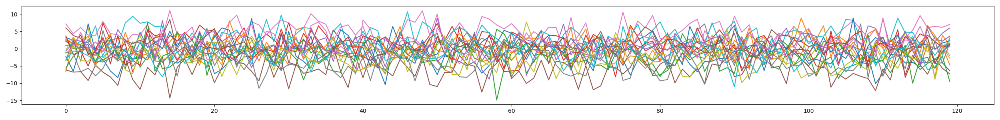

In [8]:
# plt.figure(figsize=(25,3))
# plt.plot(mms[10:30].T[:,6])
# #mms_diff = mms - mms[10].T[:,6]
# #plt.imshow(np.sum(mms_diff**2, axis=-1).T)
# plt.tight_layout()

In [30]:
corr_columns = []
for df in flatfields:
    corr_columns.append(np.mean((df - mean_flatfield).reshape(df.shape[0] * 2, -1), axis=1))
    
corr_columns = np.vstack(corr_columns)

<IPython.core.display.Javascript object>


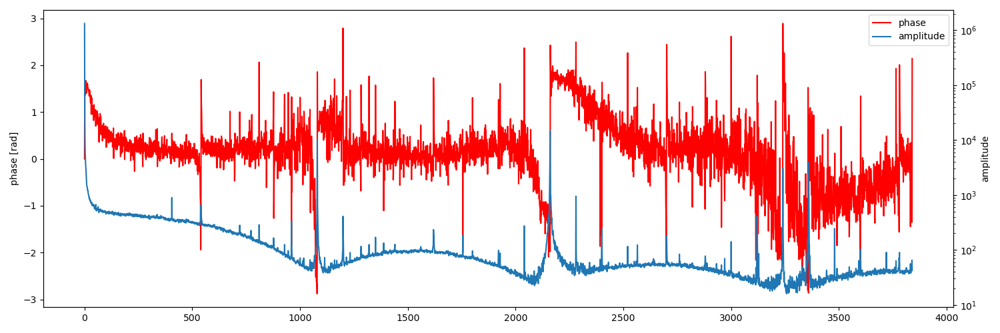

In [31]:
corr_columns_fft = np.fft.rfft(corr_columns, axis=1)
plt.figure(figsize=(15,5))
a = plt.plot(np.mean(np.angle(corr_columns_fft), axis=0), color="red", label="phase")
plt.ylabel("phase [rad]")
ax2 = plt.twinx()
b = ax2.semilogy(np.mean(np.abs(corr_columns_fft), axis=0), label="amplitude")
ax2.set_ylabel("amplitude")
plt.legend(a + b, [a[0].get_label(), b[0].get_label()])
plt.tight_layout()
plt.savefig("column_residual_noise_fft.pdf")

In [24]:
corr_rows = []
for df in darkframes:
    corr_rows.append(np.mean((df - mean_darkframes).reshape((df.shape[0] * 2, -1)), axis=0))
    
corr_rows = np.vstack(corr_rows)

<IPython.core.display.Javascript object>


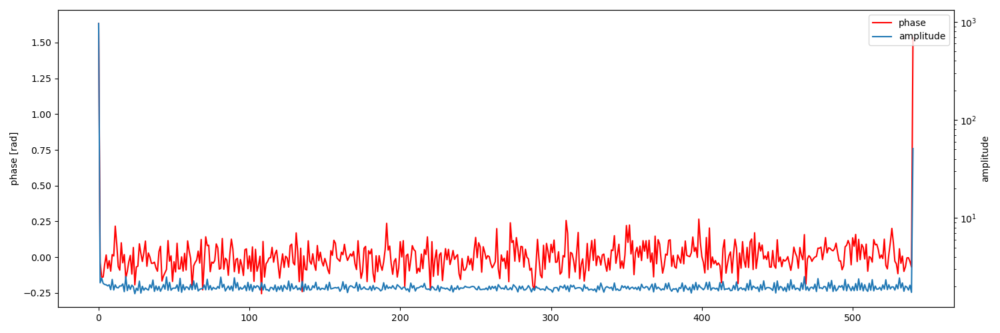

In [25]:
corr_rows_fft = np.fft.rfft(corr_rows, axis=1)
plt.figure(figsize=(15,5))
a = plt.plot(np.mean(np.angle(corr_rows_fft), axis=0), color="red", label="phase")
plt.ylabel("phase [rad]")
ax2 = plt.twinx()
b = ax2.semilogy(np.mean(np.abs(corr_rows_fft), axis=0), label="amplitude")
ax2.set_ylabel("amplitude")
plt.legend(a + b, [a[0].get_label(), b[0].get_label()])
plt.tight_layout()
plt.savefig("row_residual_noise_fft.pdf")